In [ ]:
import os
import pathlib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
sns.set()

import warnings
warnings.filterwarnings("ignore")

import tensorflow as tffrom tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing import image
from tensorflow import keras
from keras import layers,Sequential,Input

import tensorflow_hub as hub

Path to dataset files: /root/.cache/kagglehub/datasets/atulyakumar98/pothole-detection-dataset/versions/4
Class Names: ['potholes', 'normal']
Processed 100/352 images...
Processed 200/352 images...
Processed 300/352 images...
Processed 400/681 images...
Processed 500/681 images...
Processed 600/681 images...
Preprocessed 680/681 images.
Skipped 1 images due to errors.
Output saved in /root/.cache/kagglehub/datasets/atulyakumar98/preprocessed_dataset
Found 545 images belonging to 2 classes.
Found 135 images belonging to 2 classes.


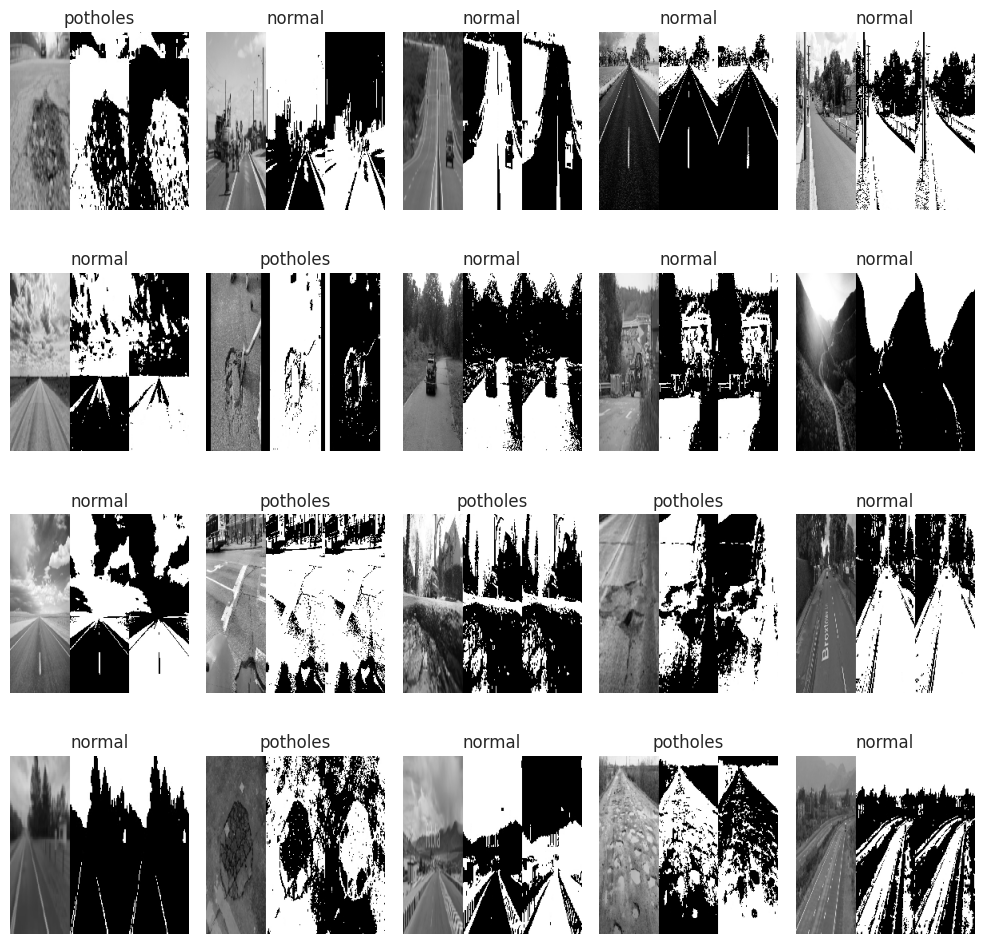

In [ ]:
import os
import pathlib
import numpy as np
import cv2
from sklearn.cluster import KMeans
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import warnings

# Suppress warnings
warnings.filterwarnings("ignore")

# TensorFlow Hub and KaggleHub imports
import kagglehub

# Step 1: Download dataset
path = kagglehub.dataset_download("atulyakumar98/pothole-detection-dataset")
print("Path to dataset files:", path)

# Dataset directory
data_dir = pathlib.Path(path)
output_dir = '/root/.cache/kagglehub/datasets/atulyakumar98/preprocessed_dataset'

# Class names from the dataset
class_names = [item.name for item in data_dir.glob('*') if item.is_dir()]
print("Class Names:", class_names)
class_names = ['normal', 'potholes']  # Adjusted mapping
# Ensure the output directory exists
os.makedirs(output_dir, exist_ok=True)

# Step 2: Preprocessing pipeline for a single image
def preprocess_and_save_image(img_path, output_path):
    """
    Preprocesses an image by applying Gaussian filtering, Otsu's thresholding,
    K-Means clustering, and saves the result.
    """
    # Load image
    image = cv2.imread(img_path)

    # Check if image is loaded
    if image is None:
        print(f"Warning: Failed to load image {img_path}. Skipping.")
        return False

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian filtering
    gaussian_filtered = cv2.GaussianBlur(gray, (5, 5), 0)

    # Apply Otsu's thresholding
    _, otsu_thresh = cv2.threshold(gaussian_filtered, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Apply K-Means clustering
    pixel_values = gaussian_filtered.reshape((-1, 1))
    pixel_values = np.float32(pixel_values)
    kmeans = KMeans(n_clusters=2, random_state=42).fit(pixel_values)
    kmeans_labels = kmeans.labels_.reshape(gray.shape)
    kmeans_result = (kmeans_labels * 255).astype("uint8")

    # Combine preprocessing results for visualization (optional)
    combined_result = np.hstack((gaussian_filtered, otsu_thresh, kmeans_result))

    # Save the preprocessed image
    cv2.imwrite(output_path, combined_result)
    return True

# Step 3: Process all images in the dataset
total_images = 0
processed_images = 0
skipped_images = 0
class_names = ['normal', 'potholes']  # Adjusted mapping
for class_name in class_names:
    class_path = os.path.join(data_dir, class_name)
    output_class_path = os.path.join(output_dir, class_name)
    os.makedirs(output_class_path, exist_ok=True)

    image_list = os.listdir(class_path)
    total_images += len(image_list)

    for img_name in image_list:
        img_path = os.path.join(class_path, img_name)
        output_img_path = os.path.join(output_class_path, img_name)

        # Preprocess and save the image
        success = preprocess_and_save_image(img_path, output_img_path)
        if success:
            processed_images += 1
        else:
            skipped_images += 1

        # Print progress every 100 images
        if processed_images % 100 == 0:
            print(f"Processed {processed_images}/{total_images} images...")

print(f"Preprocessed {processed_images}/{total_images} images.")
print(f"Skipped {skipped_images} images due to errors.")
print(f"Output saved in {output_dir}")

# Step 4: Data Generators for training and validation
data_gen = ImageDataGenerator(rescale=1/255., validation_split=0.2)

train_data = data_gen.flow_from_directory(output_dir,
                                          target_size=(224, 224),
                                          batch_size=32,
                                          subset='training',
                                          class_mode='binary')

val_data = data_gen.flow_from_directory(output_dir,
                                        target_size=(224, 224),
                                        batch_size=32,
                                        subset='validation',
                                        class_mode='binary')

# Step 5: Plot random preprocessed images
def plot_random_images():
    """
    Plots 20 random preprocessed images from the dataset.
    """
    images, labels = train_data.__next__()
    labels = labels.astype('int32')
    i = 1

    plt.figure(figsize=(10, 10))
    for image, label in zip(images, labels):
        plt.subplot(4, 5, i)
        plt.imshow(image)
        plt.title(class_names[label])
        plt.axis('off')
        i += 1
        if i == 21:
            break

    plt.tight_layout()
    plt.show()

# Display sample images
plot_random_images()

In [ ]:
images, labels = train_data.__next__()
model = Sequential([
        Input(shape = images[0].shape),
        layers.Conv2D(34,(3,3),padding = "same",activation = "relu"),
        layers.MaxPooling2D((2,2),strides = 2),
        layers.Conv2D(64,(3,3),padding = "same",activation = "relu"),
        layers.MaxPooling2D((2,2),strides = 2),
        layers.Flatten(),
        layers.Dense(128,activation = "relu"),
        layers.Dense(2,activation = "softmax")
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 224, 224, 34)        │             952 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 112, 112, 34)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 112, 112, 64)        │          19,648 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 200704)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │      25,690,240 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 2)                   │             258 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,711,098 (98.08 MB)

 Trainable params: 25,711,098 (98.08 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from keras.callbacks import ReduceLROnPlateau
reduce_lr = ReduceLROnPlateau(monitor = 'val_acc', patience = 3, verbose = 1, factor = 0.5, min_lr = 0.00001)
classifier = model.fit(train_data, batch_size = 32,
                                 epochs = 12,
                                 validation_data = val_data,
                                 verbose = 1,
                                 callbacks = [reduce_lr])

Epoch 1/12
18/18 ━━━━━━━━━━━━━━━━━━━━ 75s 4s/step - accuracy: 0.4411 - loss: 11.6088 - val_accuracy: 0.4815 - val_loss: 0.7506 - learning_rate: 0.0010
Epoch 2/12
18/18 ━━━━━━━━━━━━━━━━━━━━ 80s 4s/step - accuracy: 0.5356 - loss: 0.6519 - val_accuracy: 0.4815 - val_loss: 0.7063 - learning_rate: 0.0010
Epoch 3/12
18/18 ━━━━━━━━━━━━━━━━━━━━ 74s 4s/step - accuracy: 0.6333 - loss: 0.5806 - val_accuracy: 0.6889 - val_loss: 0.5837 - learning_rate: 0.0010
Epoch 4/12
18/18 ━━━━━━━━━━━━━━━━━━━━ 85s 4s/step - accuracy: 0.9077 - loss: 0.3300 - val_accuracy: 0.7259 - val_loss: 0.6247 - learning_rate: 0.0010
Epoch 5/12
18/18 ━━━━━━━━━━━━━━━━━━━━ 78s 4s/step - accuracy: 0.9673 - loss: 0.1034 - val_accuracy: 0.6889 - val_loss: 0.9538 - learning_rate: 0.0010
Epoch 6/12
18/18 ━━━━━━━━━━━━━━━━━━━━ 82s 4s/step - accuracy: 0.9936 - loss: 0.0234 - val_accuracy: 0.7481 - val_loss: 0.8594 - learning_rate: 0.0010
Epoch 7/12
18/18 ━━━━━━━━━━━━━━━━━━━━ 80s 4s/step - accuracy: 1.0000 - loss: 0.0031 - val_accuracy:

In [ ]:
model.evaluate(val_data)

5/5 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.7595 - loss: 1.1011


[1.1572613716125488, 0.7407407164573669]

In [ ]:
model.save('my_model.keras')

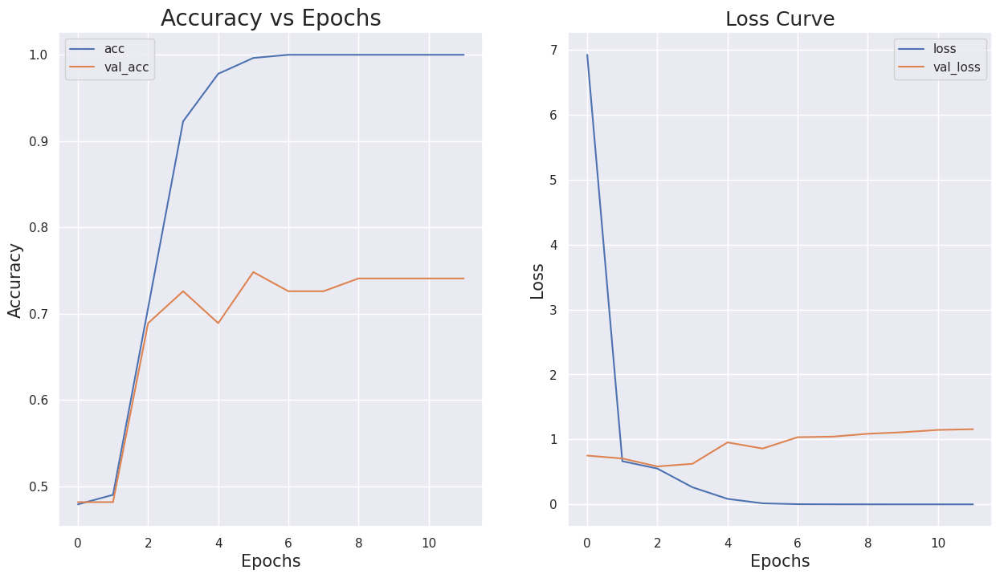

In [ ]:
def model_performance_graphs():

    fig, axes = plt.subplots(1, 2, figsize = (15, 8))

    axes[0].plot(classifier.epoch, classifier.history['accuracy'], label = 'acc')
    axes[0].plot(classifier.epoch, classifier.history['val_accuracy'], label = 'val_acc')
    axes[0].set_title('Accuracy vs Epochs', fontsize = 20)
    axes[0].set_xlabel('Epochs', fontsize = 15)
    axes[0].set_ylabel('Accuracy', fontsize = 15)
    axes[0].legend()

    axes[1].plot(classifier.epoch, classifier.history['loss'], label = 'loss')
    axes[1].plot(classifier.epoch, classifier.history['val_loss'], label="val_loss")
    axes[1].set_title("Loss Curve",fontsize=18)
    axes[1].set_xlabel("Epochs",fontsize=15)
    axes[1].set_ylabel("Loss",fontsize=15)
    axes[1].legend()

    plt.show()

model_performance_graphs()

In [ ]:
# Feature Extraction Function
def extract_features(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    lbp = local_binary_pattern(gray, P=8, R=1, method='uniform')
    lbp_hist = np.histogram(lbp.ravel(), bins=26, range=(0, 26))[0]
    lbp_hist = lbp_hist / lbp_hist.sum()
    edges = cv2.Canny(gray, 50, 150)
    edge_sum = np.sum(edges) / (gray.shape[0] * gray.shape[1])
    features = np.hstack((lbp_hist, edge_sum))
    return features

def preprocess_dataset(data_dir, class_names):
    features, labels = [], []
    for label, class_name in enumerate(class_names):
        class_path = os.path.join(data_dir, class_name)
        for img_name in os.listdir(class_path):
            img_path = os.path.join(class_path, img_name)
            img = cv2.imread(img_path)
            if img is None:
                print(f"Warning: Skipping {img_path} (failed to load).")
                continue
            features.append(extract_features(img))
            labels.append(label)
    return np.array(features), np.array(labels)


In [ ]:
def apply_pca(features, n_components=20):
    pca = PCA(n_components=n_components, random_state=42)
    features_pca = pca.fit_transform(features)
    return pca, features_pca


In [ ]:
def train_and_save_models(X_train, y_train):
    classifiers = {
        "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
        "SVM": SVC(kernel='linear', random_state=42),
        "Logistic Regression": LogisticRegression(random_state=42),
        "Naive Bayes": GaussianNB(),
        "Decision Tree": DecisionTreeClassifier(random_state=42),
    }
    for name, clf in classifiers.items():
        print(f"\nTraining {name}...")
        clf.fit(X_train, y_train)
        joblib.dump(clf, f"{name}_model.joblib")
        print(f"{name} model saved successfully!")


In [ ]:
def load_models():
    classifiers = {
        "Random Forest": joblib.load("Random Forest_model.joblib"),
        "SVM": joblib.load("SVM_model.joblib"),
        "Logistic Regression": joblib.load("Logistic Regression_model.joblib"),
        "Naive Bayes": joblib.load("Naive Bayes_model.joblib"),
        "Decision Tree": joblib.load("Decision Tree_model.joblib"),
    }
    return classifiers


In [ ]:
def calculate_pothole_distance(img, focal_length=800, real_pothole_width=0.5):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Use edge detection to identify potential pothole boundaries
    edges = cv2.Canny(gray, 50, 150)

    # Find contours in the edges
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    largest_contour = max(contours, key=cv2.contourArea, default=None)

    if largest_contour is not None and cv2.contourArea(largest_contour) > 100:  # Threshold for a valid pothole
        x, y, w, h = cv2.boundingRect(largest_contour)  # Bounding box around the pothole
        print(f"Pothole detected at: x={x}, y={y}, width={w}, height={h}")

        # Calculate distance using the pinhole camera model
        distance = (real_pothole_width * focal_length) / w
        return distance
    else:
        print("No valid pothole detected in the image.")
        return None


In [ ]:
def predict_on_image(img, classifiers, pca, focal_length=800, real_pothole_width=0.5):
    features = extract_features(img)
    features_pca = pca.transform([features])

    for name, clf in classifiers.items():
        prediction = clf.predict(features_pca)
        if prediction == 1:  # If the classifier predicts 'Pothole'
            print(f"{name} Prediction: Pothole detected.")

            # Calculate the distance to the pothole
            distance = calculate_pothole_distance(img, focal_length, real_pothole_width)
            if distance:
                print(f"Estimated distance to the pothole: {distance:.2f} meters.")
            else:
                print("Unable to calculate the distance to the pothole.")
        else:
            print(f"{name} Prediction: Normal.")


In [ ]:
import os
import pathlib
import numpy as np
import cv2
import joblib  # To save and load models
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.decomposition import PCA
from skimage.feature import local_binary_pattern
import matplotlib.pyplot as plt
import kagglehub
if __name__ == "__main__":
    # Download dataset
    path = kagglehub.dataset_download("atulyakumar98/pothole-detection-dataset")
    data_dir = pathlib.Path(path)
    class_names = ['normal', 'potholes']
    print("Preprocessing dataset...")

    # Preprocess
    features, labels = preprocess_dataset(data_dir, class_names)

    # PCA
    print("Applying PCA...")
    pca, features_pca = apply_pca(features, n_components=20)

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(features_pca, labels, test_size=0.2, random_state=42)

    # Train and save models
    print("Training and saving models...")
    train_and_save_models(X_train, y_train)

    # Load models
    classifiers = load_models()




Preprocessing dataset...
Applying PCA...
Training and saving models...

Training Random Forest...
Random Forest model saved successfully!

Training SVM...
SVM model saved successfully!

Training Logistic Regression...
Logistic Regression model saved successfully!

Training Naive Bayes...
Naive Bayes model saved successfully!

Training Decision Tree...
Decision Tree model saved successfully!


In [ ]:
from sklearn.metrics import accuracy_score
classifiers = load_models()

# Predict using the loaded models
for name, clf in classifiers.items():
    y_pred = clf.predict(X_test)  # Predict on the test set
    accuracy = accuracy_score(y_test, y_pred)  # Calculate accuracy
    print(f"{name} Accuracy: {accuracy}")

Random Forest Accuracy: 0.8308823529411765
SVM Accuracy: 0.8235294117647058
Logistic Regression Accuracy: 0.8161764705882353
Naive Bayes Accuracy: 0.7205882352941176
Decision Tree Accuracy: 0.7720588235294118


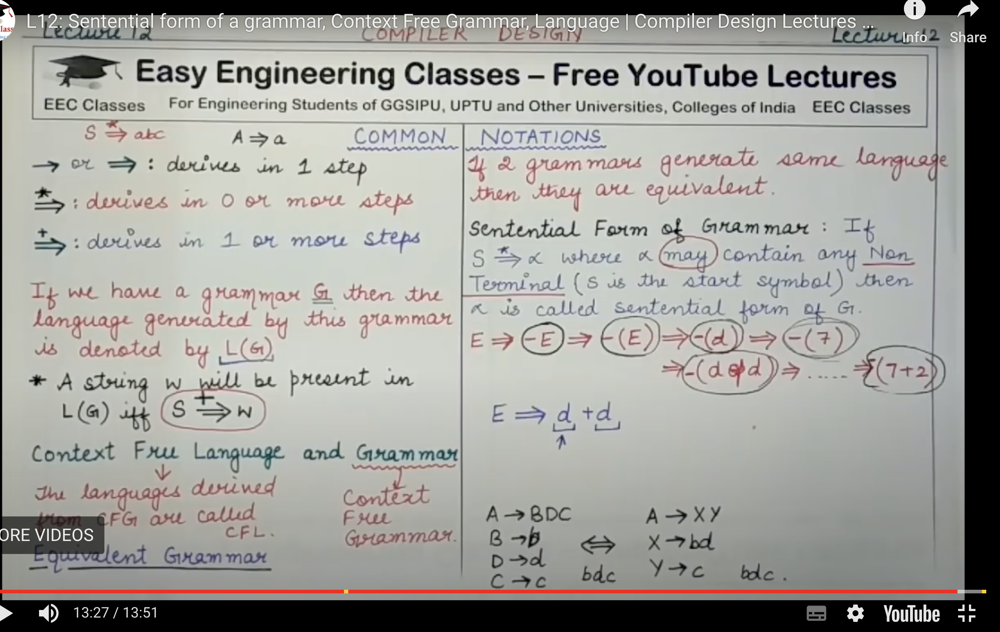

Predicting on the new image...
Random Forest Prediction: Normal.
SVM Prediction: Normal.
Logistic Regression Prediction: Normal.
Naive Bayes Prediction: Normal.
Decision Tree Prediction: Normal.


In [ ]:
from IPython.display import Image
image_path = 'try1.png'
display(Image(filename=image_path))
 # Predict on a new image
new_image_path = "/content/try1.png"
new_image = cv2.imread(new_image_path)
if new_image is not None:
    print("Predicting on the new image...")
    predict_on_image(new_image, classifiers, pca)
else:
    print(f"Error: Unable to load the image at {new_image_path}")

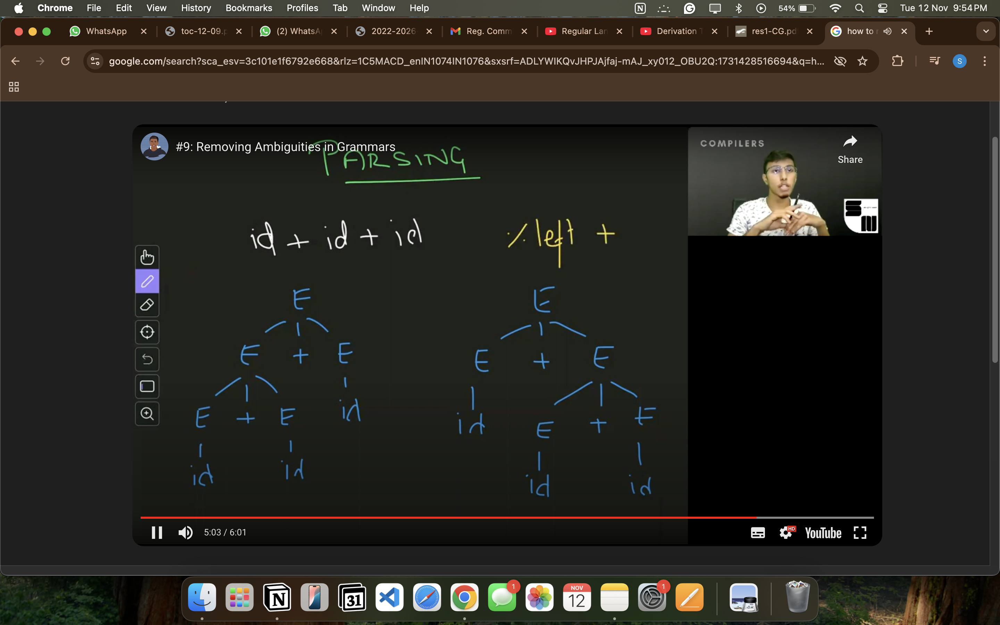

Predicting on the new image...
Random Forest Prediction: Normal.
SVM Prediction: Normal.
Logistic Regression Prediction: Normal.
Naive Bayes Prediction: Normal.
Decision Tree Prediction: Normal.


In [ ]:
from IPython.display import Image
image_path = 'try2.png'
display(Image(filename=image_path))
 # Predict on a new image
new_image_path = "/content/try2.png"
new_image = cv2.imread(new_image_path)
if new_image is not None:
    print("Predicting on the new image...")
    predict_on_image(new_image, classifiers, pca)
else:
    print(f"Error: Unable to load the image at {new_image_path}")

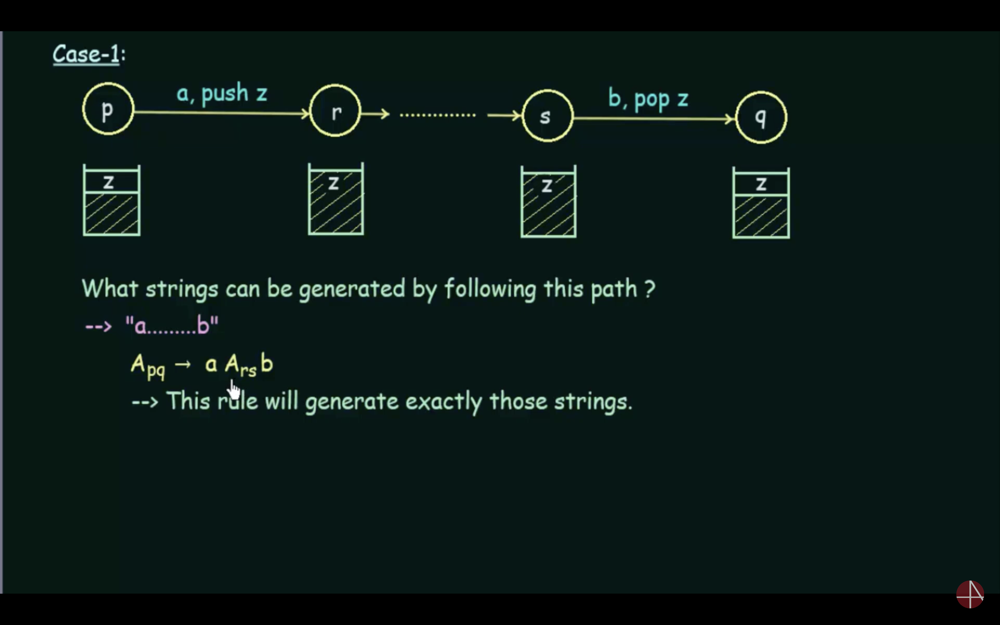

Predicting on the new image...
Random Forest Prediction: Normal.
SVM Prediction: Normal.
Logistic Regression Prediction: Normal.
Naive Bayes Prediction: Normal.
Decision Tree Prediction: Normal.


In [ ]:
from IPython.display import Image
image_path = 'try3.png'
display(Image(filename=image_path))
 # Predict on a new image
new_image_path = "/content/try3.png"
new_image = cv2.imread(new_image_path)
if new_image is not None:
    print("Predicting on the new image...")
    predict_on_image(new_image, classifiers, pca)
else:
    print(f"Error: Unable to load the image at {new_image_path}")

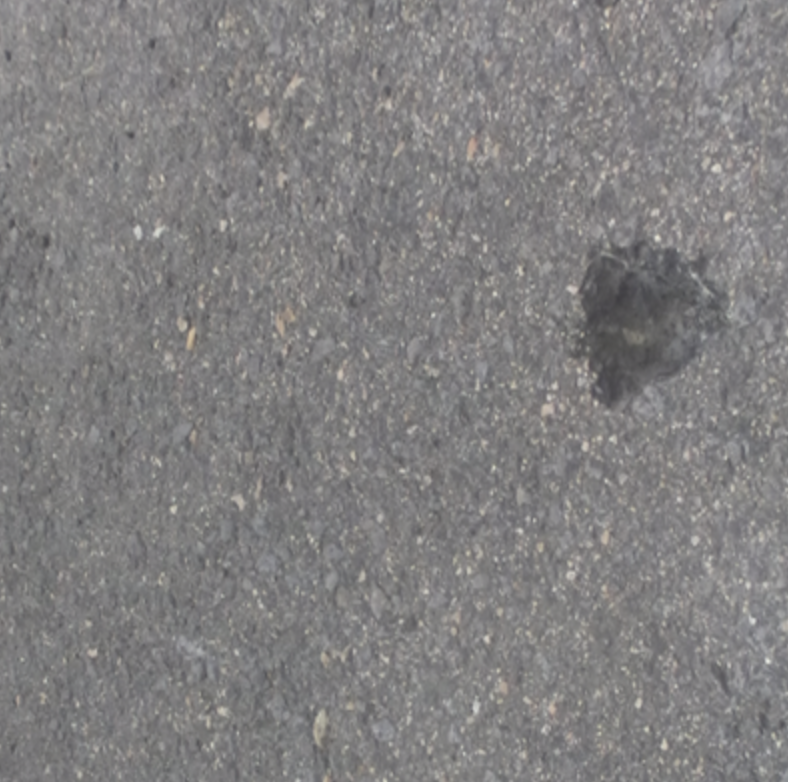

Predicting on the new image...
Random Forest Prediction: Pothole detected.
Pothole detected at: x=312, y=708, width=18, height=46
Estimated distance to the pothole: 22.22 meters.
SVM Prediction: Normal.
Logistic Regression Prediction: Normal.
Naive Bayes Prediction: Normal.
Decision Tree Prediction: Pothole detected.
Pothole detected at: x=312, y=708, width=18, height=46
Estimated distance to the pothole: 22.22 meters.


In [ ]:
from IPython.display import Image
image_path = 'try4.png'
display(Image(filename=image_path))
 # Predict on a new image
new_image_path = "/content/try4.png"
new_image = cv2.imread(new_image_path)
if new_image is not None:
    print("Predicting on the new image...")
    predict_on_image(new_image, classifiers, pca)
else:
    print(f"Error: Unable to load the image at {new_image_path}")

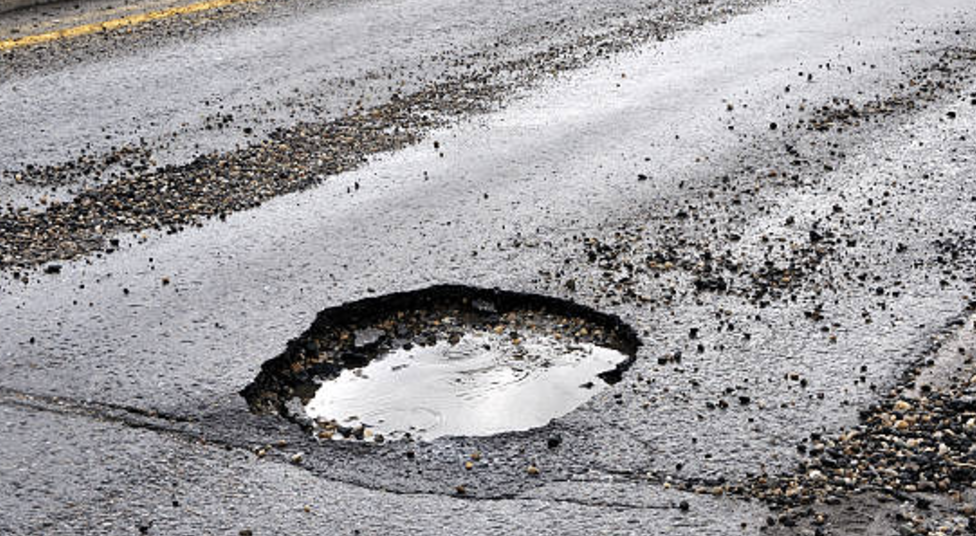

Predicting on the new image...
Random Forest Prediction: Pothole detected.
Pothole detected at: x=283, y=88, width=153, height=88
Estimated distance to the pothole: 2.61 meters.
SVM Prediction: Pothole detected.
Pothole detected at: x=283, y=88, width=153, height=88
Estimated distance to the pothole: 2.61 meters.
Logistic Regression Prediction: Pothole detected.
Pothole detected at: x=283, y=88, width=153, height=88
Estimated distance to the pothole: 2.61 meters.
Naive Bayes Prediction: Pothole detected.
Pothole detected at: x=283, y=88, width=153, height=88
Estimated distance to the pothole: 2.61 meters.
Decision Tree Prediction: Pothole detected.
Pothole detected at: x=283, y=88, width=153, height=88
Estimated distance to the pothole: 2.61 meters.


In [ ]:
from IPython.display import Image
image_path = 'try5.png'
display(Image(filename=image_path))
 # Predict on a new image
new_image_path = "/content/try5.png"
new_image = cv2.imread(new_image_path)
if new_image is not None:
    print("Predicting on the new image...")
    predict_on_image(new_image, classifiers, pca)
else:
    print(f"Error: Unable to load the image at {new_image_path}")

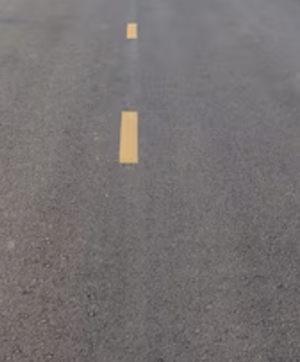

Predicting on the new image...
Random Forest Prediction: Normal.
SVM Prediction: Normal.
Logistic Regression Prediction: Normal.
Naive Bayes Prediction: Normal.
Decision Tree Prediction: Pothole detected.
Pothole detected at: x=119, y=111, width=19, height=53
Estimated distance to the pothole: 21.05 meters.


In [ ]:
from IPython.display import Image
image_path = 'try6.png'
display(Image(filename=image_path))
 # Predict on a new image
new_image_path = "/content/try6.png"
new_image = cv2.imread(new_image_path)
if new_image is not None:
    print("Predicting on the new image...")
    predict_on_image(new_image, classifiers, pca)
else:
    print(f"Error: Unable to load the image at {new_image_path}")

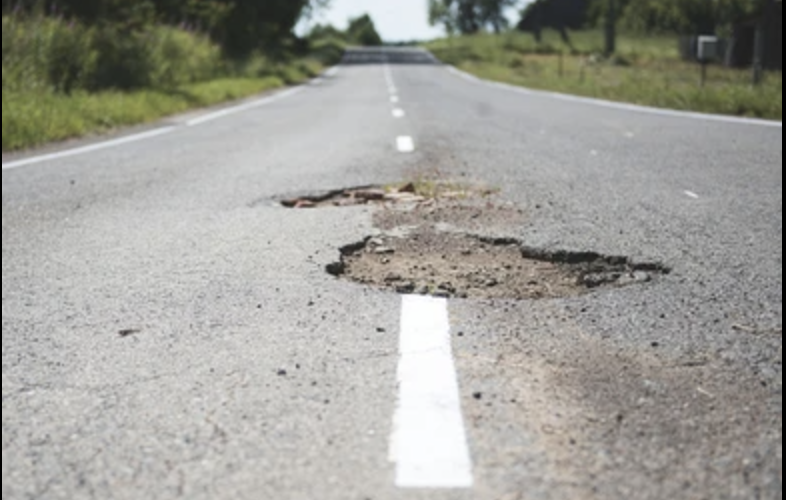

Predicting on the new image...
Random Forest Prediction: Pothole detected.
Pothole detected at: x=313, y=33, width=114, height=20
Estimated distance to the pothole: 3.51 meters.
SVM Prediction: Normal.
Logistic Regression Prediction: Normal.
Naive Bayes Prediction: Pothole detected.
Pothole detected at: x=313, y=33, width=114, height=20
Estimated distance to the pothole: 3.51 meters.
Decision Tree Prediction: Pothole detected.
Pothole detected at: x=313, y=33, width=114, height=20
Estimated distance to the pothole: 3.51 meters.


In [ ]:
from IPython.display import Image
image_path = 'try7.png'
display(Image(filename=image_path))
 # Predict on a new image
new_image_path = "/content/try7.png"
new_image = cv2.imread(new_image_path)
if new_image is not None:
    print("Predicting on the new image...")
    predict_on_image(new_image, classifiers, pca)
else:
    print(f"Error: Unable to load the image at {new_image_path}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
Predicted class: normal


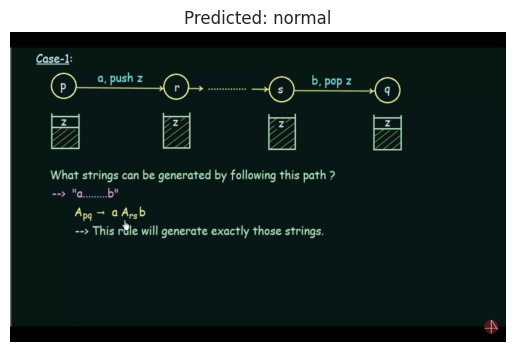

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
from sklearn.cluster import KMeans

# Preprocess the image for model prediction
def preprocess_images(img_path):
    """
    Preprocess an image by resizing, converting to array, and normalizing.
    """
    img = image.load_img(img_path, target_size=(224, 224))  # Adjust size as per model input
    img = image.img_to_array(img)  # Convert to array
    img = np.expand_dims(img, axis=0)  # Add batch dimension
    img = img / 255.0  # Normalize to [0, 1]
    return img

def calculate_distance(area, focal_length=1, real_width=0.5):
    """
    Estimate the distance to the pothole using the area or bounding box width.
    Adjust the focal length and real_width based on the setup.
    """
    # Assuming area is proportional to depth
    if area == 0:
        return float('inf')  # Avoid division by zero
    distance = (focal_length * real_width) / (area ** 0.5)
    return distance

# Load the saved model
loaded_model = load_model('my_model.keras')  # Ensure this path is correct

# Path to the image
img_path = '/content/try3.png'

# Preprocess the image
img = preprocess_images(img_path)

# Predict the class
prediction = loaded_model.predict(img)
predicted_class_index = np.argmax(prediction)
class_labels = ['normal', 'pothole']  # Ensure correct label mapping
predicted_class_label = class_labels[predicted_class_index]

print("Predicted class:", predicted_class_label)

# Display the original image
original_img = mpimg.imread(img_path)
plt.imshow(original_img)
plt.title(f"Predicted: {predicted_class_label}")
plt.axis('off')  # Hide axes
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
Predicted class: normal


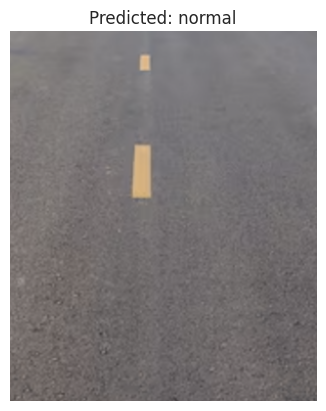

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
from sklearn.cluster import KMeans

# Preprocess the image for model prediction
def preprocess_images(img_path):
    """
    Preprocess an image by resizing, converting to array, and normalizing.
    """
    img = image.load_img(img_path, target_size=(224, 224))  # Adjust size as per model input
    img = image.img_to_array(img)  # Convert to array
    img = np.expand_dims(img, axis=0)  # Add batch dimension
    img = img / 255.0  # Normalize to [0, 1]
    return img

def calculate_distance(area, focal_length=1, real_width=0.5):
    """
    Estimate the distance to the pothole using the area or bounding box width.
    Adjust the focal length and real_width based on the setup.
    """
    # Assuming area is proportional to depth
    if area == 0:
        return float('inf')  # Avoid division by zero
    distance = (focal_length * real_width) / (area ** 0.5)
    return distance

# Load the saved model
loaded_model = load_model('my_model.keras')  # Ensure this path is correct

# Path to the image
img_path = '/content/try6.png'

# Preprocess the image
img = preprocess_images(img_path)

# Predict the class
prediction = loaded_model.predict(img)
predicted_class_index = np.argmax(prediction)
class_labels = ['normal', 'pothole']  # Ensure correct label mapping
predicted_class_label = class_labels[predicted_class_index]

print("Predicted class:", predicted_class_label)

# Display the original image
original_img = mpimg.imread(img_path)
plt.imshow(original_img)
plt.title(f"Predicted: {predicted_class_label}")
plt.axis('off')  # Hide axes
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
Predicted class: pothole


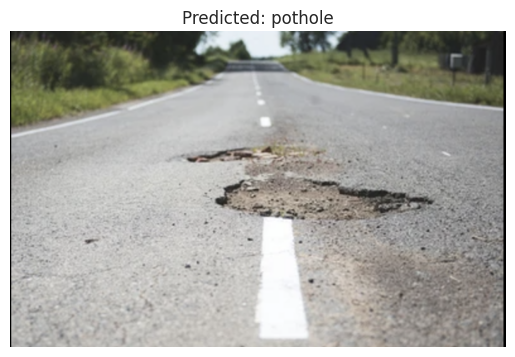

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
from sklearn.cluster import KMeans

# Preprocess the image for model prediction
def preprocess_images(img_path):
    """
    Preprocess an image by resizing, converting to array, and normalizing.
    """
    img = image.load_img(img_path, target_size=(224, 224))  # Adjust size as per model input
    img = image.img_to_array(img)  # Convert to array
    img = np.expand_dims(img, axis=0)  # Add batch dimension
    img = img / 255.0  # Normalize to [0, 1]
    return img

def calculate_distance(area, focal_length=1, real_width=0.5):
    """
    Estimate the distance to the pothole using the area or bounding box width.
    Adjust the focal length and real_width based on the setup.
    """
    # Assuming area is proportional to depth
    if area == 0:
        return float('inf')  # Avoid division by zero
    distance = (focal_length * real_width) / (area ** 0.5)
    return distance

# Load the saved model
loaded_model = load_model('my_model.keras')  # Ensure this path is correct

# Path to the image
img_path = '/content/try7.png'

# Preprocess the image
img = preprocess_images(img_path)

# Predict the class
prediction = loaded_model.predict(img)
predicted_class_index = np.argmax(prediction)
class_labels = ['normal', 'pothole']  # Ensure correct label mapping
predicted_class_label = class_labels[predicted_class_index]

print("Predicted class:", predicted_class_label)

# Display the original image
original_img = mpimg.imread(img_path)
plt.imshow(original_img)
plt.title(f"Predicted: {predicted_class_label}")
plt.axis('off')  # Hide axes
plt.show()